
# Lab on Introduction to "Learning based beamforming in ultrasound imaging"
---
# Topic 2: Learning based Ultrasound Imaging Signal Chain

---


In case downloading dataset using 'gdown' doesn't work, use the below code or download and upload the data from the drive link: (https://drive.google.com/file/d/1IuFjmA_zzEHVdaVnB2kLK2ChEvPZHE5p/view?usp=drive_link)


---


The dataset used is from https://zenodo.org/records/7813791 and cite the following references if you are using it for any research purpose (strictly research purpose only).


---



*References: Mathews, Roshan P., and Mahesh Raveendranatha Panicker. "Towards fast region adaptive ultrasound beamformer for plane wave imaging using convolutional neural networks." In 2021 43rd Annual International Conference of the IEEE Engineering in Medicine & Biology Society (EMBC), pp. 2910-2913. IEEE, 2021.*

# Import necessary libraries

In [1]:
import h5py
import torch
import torch.nn as nn
import torch.nn.functional as F
import numpy as np
import os
from torch.utils.data import Dataset
from scipy.interpolate import interp1d # For delay adjustment in ultrasound using 1D cubic interpolation
from scipy.ndimage import zoom
from torch.nn import MSELoss, L1Loss
from torch.optim import Adam
from torch.utils.tensorboard import SummaryWriter
from torch.utils.data import random_split, DataLoader
import matplotlib.pyplot as plt
import zipfile
import argparse
from torch.cuda.amp import autocast, GradScaler
from torch.optim.lr_scheduler import StepLR,ReduceLROnPlateau
import gdown
from monai.networks.layers import HilbertTransform

# Read and unzip the data

In [ ]:
! ls

'Copy of W6_Medical_Image_Recon_DL.ipynb'	    'uc?id=1IuFjmA_zzEHVdaVnB2kLK2ChEvPZHE5p'
'Copy of W6_Medical_Image_Recon_Traditional.ipynb'


In [2]:
# Path to your zip file in Google Drive
zip_path = 'wrist_tofc.zip'

# Directory where you want to extract the files
extract_dir = '.'

# Extract the zip file
with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_dir)

# Check extracted files
os.listdir(extract_dir)

['part1_traditionalCV.ipynb',
 'med_venv',
 'README.md',
 'wrist_tofc',
 'wrist_tofc.zip',
 'part2_DeepLearning.ipynb',
 '.git']

In [2]:
class CustomDataset(Dataset):  # Renamed to follow CamelCase

    @staticmethod
    def getFiles(path):
        paths = []
        for root, _, files in os.walk(path):
            for file in files:
                paths.append(os.path.join(root, file))
        return paths

    @staticmethod
    def readFile(path):
        with h5py.File(path, "r") as dataFrame:
            inp = np.array(dataFrame['inp'], dtype="float32")  / 16384
            out = np.array(dataFrame['out'], dtype="float32")

        return inp, out

    def __init__(self, path):
        super(CustomDataset, self).__init__()
        self.filePaths = self.getFiles(path)

    def __len__(self):
        return len(self.filePaths)

    def __getitem__(self, index):
        if index < len(self.filePaths):
            path = self.filePaths[index]
            inp, out = self.readFile(path)

            inp = torch.from_numpy(inp).float()  # Use torch.from_numpy for better performance

            out = torch.from_numpy(out).float()

            return {
                'input': inp,
                'output': out
            }


In [3]:
class AntiRectifier(nn.Module):
    def __init__(self):
        super().__init__()

    def forward(self, x):
        x = x - torch.mean(x, dim=1, keepdim=True)  # Subtract mean along dimension 1
        x = F.normalize(x, p=2, dim=1)  # Normalize across dimension 1
        pos_neg = torch.cat([F.relu(x), F.relu(-x)], dim=1)  # Combine positive and negative rectified parts
        return pos_neg


class DoubleConv(nn.Module):
    def __init__(self, in_channels, out_channels, mid_channels=None):
        super().__init__()
        mid_channels = mid_channels or out_channels
        self.conv1 = nn.Conv2d(in_channels, mid_channels, kernel_size=3, padding=1)
        self.bn1 = nn.BatchNorm2d(mid_channels)
        self.act1 = AntiRectifier()

        self.conv2 = nn.Conv2d(2 * mid_channels, out_channels // 2, kernel_size=3, padding=1)
        self.bn2 = nn.BatchNorm2d(out_channels // 2)
        self.act2 = AntiRectifier()

    def forward(self, x):
        x = self.conv1(x)
        x = self.bn1(x)
        x = self.act1(x)

        x = self.conv2(x)
        x = self.bn2(x)
        x = self.act2(x)
        return x

class Down(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.maxpool_conv = nn.Sequential(
            nn.MaxPool2d(2),
            DoubleConv(in_channels, out_channels)
        )

    def forward(self, x):
        return self.maxpool_conv(x)


class Up(nn.Module):
    def __init__(self, in_channels, out_channels, bilinear=True):
        super().__init__()
        if bilinear:
            self.up = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)
        else:
            self.up = nn.ConvTranspose2d(in_channels, in_channels // 2, kernel_size=2, stride=2)
        self.conv = DoubleConv(in_channels, out_channels, in_channels // 2)

    def forward(self, x1, x2):
        x1 = self.up(x1)

        # Interpolate x1 to match the size of x2 instead of using manual padding
        x1 = F.interpolate(x1, size=x2.shape[2:], mode="bilinear", align_corners=False)

        # Concatenate and perform convolution
        x = torch.cat([x2, x1], dim=1)
        return self.conv(x)

class OutConv(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(OutConv, self).__init__()
        self.conv = nn.Conv2d(in_channels, out_channels, kernel_size=1)

    def forward(self, x):
        return self.conv(x)



class UNetBeamformer(nn.Module):
    def __init__(self, n_channels=128, bilinear=False):
        super(UNetBeamformer, self).__init__()
        self.inc = DoubleConv(n_channels, 64)
        self.down1 = Down(64, 128)
        self.down2 = Down(128, 256)
        self.down3 = Down(256, 512)
        self.up1 = Up(512, 256 , bilinear)
        self.up2 = Up(256, 128, bilinear)
        self.up3 = Up(128, 64, bilinear)
        self.outc = OutConv(64, n_channels)


    def forward(self, x):
        x1 = self.inc(x)
        x2 = self.down1(x1)
        x3 = self.down2(x2)
        x4 = self.down3(x3)

        x = self.up1(x4, x3)
        x = self.up2(x, x2)
        x = self.up3(x, x1)
        x = self.outc(x)

        return F.softmax(x, dim=1)

# Example usage
# model = UNetBeamformer(n_channels=128)
# input_tensor = torch.randn(1, 128, 374, 128)  # batch size = 1 for example, 128 channels, 374 x 128 image
# output = model(input_tensor)

## Need to check if the MAE is better MSE

In [6]:
class Trainer():

    @staticmethod
    def norm(x):
        return (x - torch.min(x)) / (torch.max(x) - torch.min(x))

    def __init__(self, dataset, args, split=0.8):
        self.bs = args.bs
        self.lr = args.lr
        self.loss = args.loss
        self.model = UNetBeamformer()
        # self.criterion = L1Loss() 
        
        if (self.loss == 'MAE'):
            self.criterion = L1Loss()
        elif (self.loss == 'MSE'):
            self.criterion = MSELoss()
        else:
            raise ValueError(f'self.loss value: {self.loss} is not of the correct type')

        # Train/Validation split
        self.train_size = int(len(dataset) * split)
        self.valid_size = len(dataset) - self.train_size
        self.train_set, self.valid_set = random_split(
            dataset, [self.train_size, self.valid_size], generator=torch.Generator().manual_seed(42)
        )

        # DataLoader with configurable number of workers
        self.train_data = DataLoader(self.train_set, batch_size=self.bs, shuffle=True, num_workers=args.num_workers, pin_memory=True)
        self.valid_data = DataLoader(self.valid_set, batch_size=self.bs, num_workers=args.num_workers, pin_memory=True)

        # Device setup
        self.device = "cuda" if torch.cuda.is_available() else "cpu"
        self.model = self.model.to(self.device)
        self.save_paths = args.save

    def train(self, epochs, run_no, ground_truth_logged=False):
        # Set up directories and logging
        save_paths = self.save_paths
        os.makedirs(os.path.join(save_paths, "chkpt/", 'iter_' + str(run_no)), exist_ok=True)
        os.makedirs(os.path.join(save_paths, "logs/"), exist_ok=True)
        writer = SummaryWriter(os.path.join(save_paths, 'logs/iter_' + str(run_no)))

        chkpt = os.path.join(save_paths, "chkpt", 'iter_' + str(run_no), "model.pt")
        best = os.path.join(save_paths, "chkpt", 'iter_' + str(run_no), "best.pt")
        optimizer = Adam(self.model.parameters(), lr=self.lr)
        scaler = GradScaler()
        #scheduler = StepLR(optimizer, step_size=100, gamma=0.5)  # Learning rate scheduler
        scheduler = ReduceLROnPlateau(optimizer, mode='min', patience=15, factor=0.1, verbose=True)


        # Load checkpoint if exists
        if os.path.exists(chkpt):
            checkpoint = torch.load(chkpt)
            self.model.load_state_dict(checkpoint['model_state_dict'])
            optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
            scheduler.load_state_dict(checkpoint.get('scheduler_state_dict', scheduler.state_dict()))
            start = checkpoint['epoch']
            train_step = checkpoint['train_step']
            val_step = checkpoint['val_step']
            threshold = checkpoint['loss']
        else:
            start = 0
            train_step = 0
            val_step = 0
            threshold = 1000
            ground_truth_logged = True

        # Training loop
        for epoch in range(start, epochs):
            self.model.train()
            train_loss = 0
            val_loss = 0

            for i, batch in enumerate(self.train_data):
                input_data = batch['input'].to(self.device)
                output = batch['output'].to(self.device)

                with autocast():
                    # predicts the weights with the input data
                    pred = self.model(input_data)
                    beamformed = torch.mul(pred, input_data)
                    # collapse in the channel dim
                    beamformed_sum = torch.sum(beamformed, axis=1)
                    # for the amplitude
                    beamformed_sum = HilbertTransform(axis=1)(beamformed_sum)
                    envelope = torch.abs(beamformed_sum)
                    # low compression to see the smaller values and the higher values together
                    imPred = 20 * torch.log10(envelope / torch.clip(torch.max(envelope), min=1e-8))
                    # compare the predicition w the ground truth
                    loss = self.criterion(imPred, output) / 4  # Gradient accumulation over 4 steps

                # loss.backward()  # Backpropagation
                # optimizer.step()  # Update the weights

                scaler.scale(loss).backward()

                # Accumulate gradients and update every 4 steps
                if (i + 1) % 4 == 0:
                    scaler.step(optimizer)
                    scaler.update()
                    optimizer.zero_grad()

                train_loss += loss.item() * 4  # Undo the division for logging purposes

                train_step += 1

            train_loss /= len(self.train_set)

            # Validation loop
            val_loss, ground_truth_logged = self.validate(val_step, writer, epoch, ground_truth_logged)

            print(f'Epoch = {epoch:3d}, Training Loss = {train_loss:.3f}, Validation Loss = {val_loss:.3f}')
            writer.add_scalar('Train Loss', train_loss, global_step=epoch)
            writer.add_scalar('Validation Loss', val_loss, global_step=epoch)
            # Learning rate scheduler step
            scheduler.step(val_loss)

            # Save checkpoint
            if epoch % 5 == 0 or val_loss < threshold:
                print("Saving model checkpoint...")
                torch.save({
                    'epoch': epoch,
                    'model_state_dict': self.model.state_dict(),
                    'optimizer_state_dict': optimizer.state_dict(),
                    'scheduler_state_dict': scheduler.state_dict(),
                    'loss': val_loss,
                    'train_step': train_step,
                    'val_step': val_step,
                }, chkpt)

            # Save the best model
            if val_loss < threshold:
                print("Saving best model weights")
                threshold = val_loss
                torch.save(self.model.state_dict(), best)

            writer.flush()

        writer.close()

    def validate(self, val_step, writer, epoch, ground_truth_logged):
        self.model.eval()
        val_loss = 0

        with torch.no_grad():
            for batch in self.valid_data:
                input_data = batch['input'].to(self.device)
                output = batch['output'].to(self.device)

                with autocast():
                    pred = self.model(input_data)
                    beamformed = torch.mul(pred, input_data)
                    beamformed_sum = torch.sum(beamformed, axis=1)
                    beamformed_sum = HilbertTransform(axis=1)(beamformed_sum)
                    envelope = torch.abs(beamformed_sum)
                    imPred = 20 * torch.log10(envelope / torch.clip(torch.max(envelope), min=1e-8))
                    loss = self.criterion(imPred, output)

                val_loss += loss.item()
                val_step += 1

        val_loss /= len(self.valid_set)

        # Now save the best image to see the iteration

        # Convert to numpy for visualization
        imPred = self.norm(imPred)
        output = self.norm(output)
        imPred = imPred.detach().cpu().numpy()
        output = output.detach().cpu().numpy()


        # TensorBoard Image logging
        # Log ground truth only once, during the first batch
        if ground_truth_logged:
            writer.add_image('GT', output[0], global_step=epoch, dataformats='HW')
        writer.add_image('Pred'+str(epoch), imPred[0], global_step=epoch, dataformats='HW')

        # Visualization using matplotlib
        # Display the ground truth and prediction for visual reference, only once
        if ground_truth_logged:
            plt.imshow(output[0], cmap='gray', aspect='auto')
            plt.axis('off')
            plt.title('Ground Truth')
            plt.show()
            ground_truth_logged = False  # Ensure ground truth is logged once

        plt.imshow(imPred[0], cmap='gray', aspect='auto')
        plt.axis('off')

        return val_loss,ground_truth_logged


/tmp/ipykernel_31946/608941432.py:47: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = GradScaler()
/home/jeremy/Documents/code/Medical_Image_Reconstruction/med_venv/lib/python3.11/site-packages/torch/optim/lr_scheduler.py:60: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/tmp/ipykernel_31946/608941432.py:79: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():
/tmp/ipykernel_31946/608941432.py:151: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():


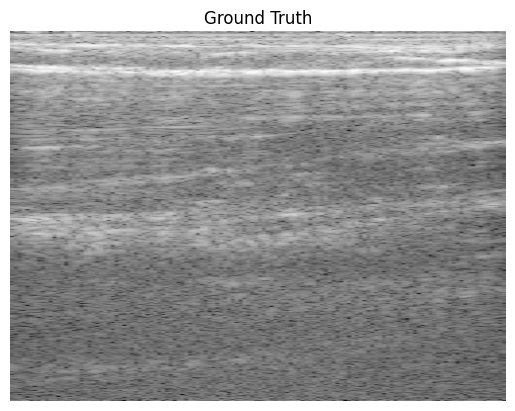

Epoch =   0, Training Loss = 26.332, Validation Loss = 22.089
Saving model checkpoint...
Saving best model weights
Epoch =   1, Training Loss = 20.933, Validation Loss = 18.504
Saving model checkpoint...
Saving best model weights
Epoch =   2, Training Loss = 17.480, Validation Loss = 16.245
Saving model checkpoint...
Saving best model weights
Epoch =   3, Training Loss = 15.972, Validation Loss = 15.022
Saving model checkpoint...
Saving best model weights
Epoch =   4, Training Loss = 14.874, Validation Loss = 14.263
Saving model checkpoint...
Saving best model weights
Epoch =   5, Training Loss = 13.822, Validation Loss = 13.687
Saving model checkpoint...
Saving best model weights
Epoch =   6, Training Loss = 13.111, Validation Loss = 13.005
Saving model checkpoint...
Saving best model weights
Epoch =   7, Training Loss = 12.624, Validation Loss = 12.964
Saving model checkpoint...
Saving best model weights
Epoch =   8, Training Loss = 12.780, Validation Loss = 12.690
Saving model check

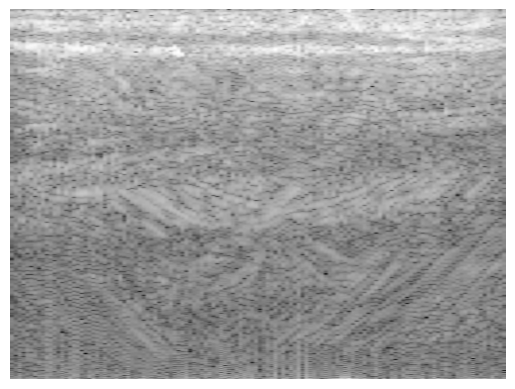

In [7]:
parser = argparse.ArgumentParser()
parser.add_argument("--data", type=str,default = 'wrist_tofc')
parser.add_argument("--save", type=str,default = 'UNET_30_MSE_Results')
parser.add_argument("--epochs", type=int,default=30)
parser.add_argument("--bs", type=int,default=8)
parser.add_argument("--lr", type=float,default=1e-3)
parser.add_argument("--run", type=int,default=1)
parser.add_argument("--num_workers", type=int,default=1)
parser.add_argument("--loss", type=str, default= 'MSE')
args = parser.parse_args([])  # This simulates no command-line arguments

DATASET = CustomDataset(args.data)

T = Trainer(DATASET, args)
T.train(epochs=args.epochs, run_no=args.run)

/tmp/ipykernel_31946/608941432.py:47: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = GradScaler()
/tmp/ipykernel_31946/608941432.py:79: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():
/tmp/ipykernel_31946/608941432.py:151: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():


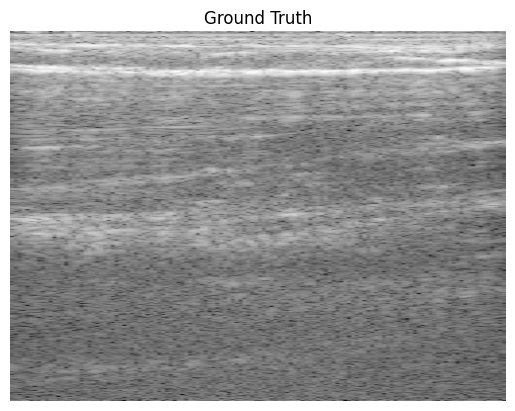

Epoch =   0, Training Loss = 1.421, Validation Loss = 1.292
Saving model checkpoint...
Saving best model weights
Epoch =   1, Training Loss = 1.253, Validation Loss = 1.180
Saving model checkpoint...
Saving best model weights
Epoch =   2, Training Loss = 1.157, Validation Loss = 1.111
Saving model checkpoint...
Saving best model weights
Epoch =   3, Training Loss = 1.109, Validation Loss = 1.064
Saving model checkpoint...
Saving best model weights
Epoch =   4, Training Loss = 1.046, Validation Loss = 1.043
Saving model checkpoint...
Saving best model weights
Epoch =   5, Training Loss = 0.993, Validation Loss = 1.017
Saving model checkpoint...
Saving best model weights
Epoch =   6, Training Loss = 0.977, Validation Loss = 0.966
Saving model checkpoint...
Saving best model weights
Epoch =   7, Training Loss = 0.948, Validation Loss = 0.947
Saving model checkpoint...
Saving best model weights
Epoch =   8, Training Loss = 0.921, Validation Loss = 0.929
Saving model checkpoint...
Saving be

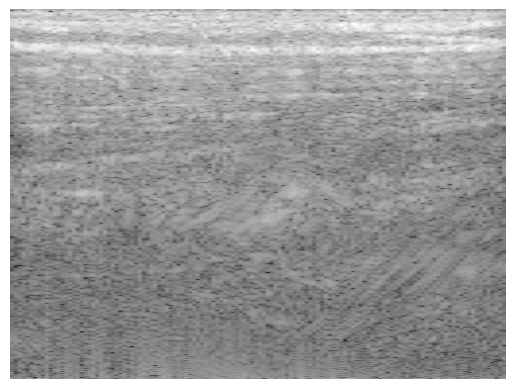

In [8]:
parser = argparse.ArgumentParser()
parser.add_argument("--data", type=str,default = 'wrist_tofc')
parser.add_argument("--save", type=str,default = 'UNET_30_MAE_Results')
parser.add_argument("--epochs", type=int,default=30)
parser.add_argument("--bs", type=int,default=8)
parser.add_argument("--lr", type=float,default=1e-3)
parser.add_argument("--run", type=int,default=1)
parser.add_argument("--num_workers", type=int,default=1)
parser.add_argument("--loss", type=str, default= 'MAE')
args = parser.parse_args([])  # This simulates no command-line arguments

DATASET = CustomDataset(args.data)

T = Trainer(DATASET, args)
T.train(epochs=args.epochs, run_no=args.run)

In [1]:
def load_best_model(model_class, checkpoint_dir):
    best_model = model_class()
    best_checkpoint_path = os.path.join(checkpoint_dir, 'best.pt')
    if os.path.exists(best_checkpoint_path):
        best_model.load_state_dict(torch.load(best_checkpoint_path))
        print(f"Loaded best model from {best_checkpoint_path}")
    else:
        print(f"No best model found in {checkpoint_dir}")
    return best_model


device = "cuda" if torch.cuda.is_available() else "cpu"
best_UNET_MSE = load_best_model(UNetBeamformer, 'Results/UNET_30_MAE_Results/chkpt/iter_1').to(device)
best_UNET_MAE = load_best_model(UNetBeamformer, 'Results/UNET_30_MAE_Results/chkpt/iter_1').to(device)

T = Trainer(DATASET, args)
test_loader = T.valid_data


def evaluate_models(mse_model, mae_model, test_loader):
    device = "cuda" if torch.cuda.is_available() else "cpu"
    mse_model.eval()
    mae_model.eval()

    test_loss_mse = 0
    test_loss_mae = 0

    criterion_mse = nn.MSELoss()
    criterion_mae = nn.L1Loss()

    with torch.no_grad():
        for batch in test_loader:
            input_data = batch['input'].to(device)
            ground_truth = batch['output'].to(device)
            
            # pred_mse = mse_model(input_data)
            # pred_mae = mae_model(input_data)
            
            output_mse = mse_model(input_data)
            beamformed = torch.mul(output_mse, input_data)
            beamformed_sum = torch.sum(beamformed, axis=1)
            beamformed_sum = HilbertTransform(axis=1)(beamformed_sum)
            envelope = torch.abs(beamformed_sum)
            imPred = 20 * torch.log10(envelope / torch.clip(torch.max(envelope), min=1e-8))
            mse_loss = criterion_mse(imPred, output_mse)

            output_mae = mae_model(input_data)
            beamformed = torch.mul(output_mae, input_data)
            beamformed_sum = torch.sum(beamformed, axis=1)
            beamformed_sum = HilbertTransform(axis=1)(beamformed_sum)
            envelope = torch.abs(beamformed_sum)
            imPred = 20 * torch.log10(envelope / torch.clip(torch.max(envelope), min=1e-8))
            mae_loss = criterion_mse(imPred, output_mae)

            test_loss_mse += mse_loss.item()
            test_loss_mae += mae_loss.item()

    test_loss_mse /= len(test_loader)
    test_loss_mae /= len(test_loader)

    return test_loss_mse, test_loss_mae

evaluate_models(best_UNET_MSE, best_UNET_MAE, test_loader)

NameError: name 'torch' is not defined

## visualization from Prof



The learning of the algorithm can be seen as in

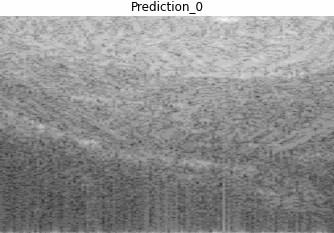

Seeing the tensorboard logs for the trained model

In [10]:
%load_ext tensorboard
%tensorboard --logdir ./UNET_30_MAE_Results/logs/iter_1

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard
